# Packages 

In [1]:
import os
import json
import pdb
import itertools
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
import matplotlib as mpl
import seaborn as sns
import pandas as pd
import matplotlib.ticker as ticker
import matplotlib.patches as mpatches
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings("ignore")

# Time series
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.api import AutoReg
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.tsa.stattools import adfuller
from sklearn.model_selection import TimeSeriesSplit

# ARCH
from arch import arch_model

# LSTM
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.optimizers import Adam
from scipy.optimize import minimize
from sklearn.preprocessing import MinMaxScaler


# Jump Diffusion 
from sklearn.preprocessing import StandardScaler

# Process Track 
from tqdm import tqdm


In [2]:
# Simple average ensemble 

def simple_average_ensemble(predictions):
    """
    Simple average ensemble of multiple model predictions.

    Parameters:
        predictions (list of np.array): List of prediction arrays from different models.

    Returns:
        np.array: Ensemble predictions obtained by averaging.
    """
    return np.mean(predictions, axis=0)


# Utilities 

In [3]:
def get_online_quantile(scores, q_1, etas, alpha):
    """
    Computes the online quantile of a set of scores.
    :param scores: (np.array) The scores.
    :param q_1: (float) The quantile to compute.
    :param eta: (np.array) The sequence of learning rates.
    :return: (float) The sequence of online quantiles.
    """
    T = scores.shape[0]
    q = np.zeros(T)
    q[0] = q_1
    for t in range(T):
        err_t = (scores[t] > q[t]).astype(int)
        if t < T - 1:
            q[t + 1] = q[t] - etas[t] * (alpha - err_t)
    return q


def compute_coverage_metrics(Y, Yhat, alpha, epsilon, W, C):
    """
    Compute online quantiles, observed coverages
    Parameters:
        scores (numpy array): Array of scores for the main dataset.
        scores_val (numpy array): Array of scores for the validation dataset.
        alpha (float): 1 - alpha is the desired coverage level.
        epsilon (float): Decay parameter for eta in the decaying quantile.
        W (int): Window size for rolling coverage computation.
        C: Constant of etas decaying 

    Returns:
        dict: Dictionary containing all computed metrics.
    """
    scores = np.abs(Y - Yhat)
    T = len(scores)
    
    # Define learning rates
    etas_decaying = C * (np.array([1 / (t ** (1 / 2 + epsilon)) for t in range(1, T + 1)]))

    # Initialize first quantile value
    q_1 = scores[0]

    # Compute online quantiles
    q_decaying = get_online_quantile(scores, q_1, etas_decaying, alpha)

    # Compute observed coverage
    observed_coverages_decaying = (scores <= q_decaying).astype(int)

    # Compute long-run coverage
    LRC_decaying = np.cumsum(observed_coverages_decaying) / (np.arange(len(observed_coverages_decaying)) + 1)

    return {
        "T":T,
        "q_decaying": q_decaying,
        "observed_coverages_decaying": observed_coverages_decaying,
        "LRC_decaying": LRC_decaying,

    }

def plot_coverage_results(results, alpha, W):
    """
    Plots the quantile evolution, coverage
    for a single dataset using results from compute_coverage_metrics.

    Parameters:
        results (dict): Dictionary output from compute_coverage_metrics.
        alpha (float): 1 - alpha is the desired coverage level.
        W (int): Window size for rolling coverage computation.

    Returns:
        None (Displays the plot).
    """

    T = results['T']

    sns.set_style("white")
    sns.set_palette("Set2")

    # Quantiles 
    plt.figure(figsize=(6, 3))
    plt.plot(range(T), results["q_decaying"], label=r'$\eta_t = \frac{1}{t^{1/2+\epsilon}}$')
    plt.ylabel(r'$q_t$')
    plt.xlabel(r'time $t$')
    plt.legend()
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()

    # Long-run coverage
    plt.figure(figsize=(6, 3))
    plt.plot(range(T), results["LRC_decaying"], label=r'$\eta_t = \frac{1}{t^{1/2+\epsilon}}$')
    plt.axhline(y=1 - alpha, linestyle='dotted', color="k", linewidth=2, label=r'$1-\alpha$')
    plt.xlabel(r'time $t$')
    plt.ylabel("long-run coverage")
    plt.legend()
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()


def create_sequences(data, seq_length, train_ratio=0.8):
    data = np.array(data) 
    data_len = len(data)
    train_size = int(data_len * train_ratio)

    train_data = data[:train_size]
    test_data  = data[train_size:] 

    # Training sequences
    X_train, y_train = [], []
    for i in range(len(train_data) - seq_length):
        X_train.append(train_data[i:i+seq_length])
        y_train.append(train_data[i+seq_length])

    # Testing sequences
    X_test, y_test = [], []
    for i in range(len(test_data) - seq_length):
        X_test.append(test_data[i:i+seq_length])
        y_test.append(test_data[i+seq_length])

    # Reshape for LSTM [samples, timesteps, features]
    X_train = np.array(X_train).reshape(-1, seq_length, 1)
    y_train = np.array(y_train)
    X_test  = np.array(X_test).reshape(-1, seq_length, 1)
    y_test  = np.array(y_test)

    return X_train, X_test, y_train, y_test


# COMA 

def hedge(loss_matrix, eta):
    """
    Hedge algorithm.

    Parameters
    ----------
    loss_matrix : np.ndarray
        Shape (N, K), loss of K experts during N rounds.
    eta : float
        Learning rate parameter.

    Returns
    -------
    dict
        h : np.ndarray of shape (N,)
            Weighted average loss at each round.
        weights : np.ndarray of shape (N, K)
            Expert weights at each round.
    """
    N, K = loss_matrix.shape
    h = np.full(N, np.nan)       
    weights = np.full((N, K), np.nan)  # N x K matrix
    w = np.full(K, 1.0 / K)         # start uniform weights

    for t in range(N):
        weights[t, :] = w
        w = w * np.exp(-eta * loss_matrix[t, :])  # exponential weighting
        w = w / np.sum(w)                         # normalize
        h[t] = np.sum(w * loss_matrix[t, :])      # weighted average loss

    return {"h": h, "weights": weights}


def counts_int(M, a, b, w):
    """
    Compute weighted fraction of intervals in M that cover the midpoint of [a,b].
    
    Parameters
    ----------
    M : np.ndarray
        Shape (n, 2), intervals with lower and upper bounds.
    a, b : float
        Interval boundaries.
    w : np.ndarray
        Weights for each interval (length n).
    
    Returns
    -------
    float
        Weighted mean (between 0 and 1).
    """
    mid = 0.5 * (a + b)
    inside = (M[:, 0] <= mid) & (mid <= M[:, 1]) 
    inside = inside.astype(float)                  
    num_int = np.average(inside, weights=w)
    return num_int


def mix(L, eta):
    """
    Python translation of R mix().
    """
    mn = np.min(L)

    if np.isinf(eta):
        w = (L == mn).astype(float)
        w /= w.sum()
    else:
        w = np.exp(-eta * (L - mn))

    s = np.sum(w)
    w = w / s
    M = mn - (1.0 / eta) * np.log(s / len(L)) if not np.isinf(eta) else mn

    return {"w": w, "M": M}

def adahedge(loss_matrix):
    N, K = loss_matrix.shape
    h = np.full(N, np.nan)
    L = np.zeros(K)
    etas = np.full(N, np.nan)
    weights = np.full((N, K), np.nan)
    Delta = 0.0

    for t in range(N):
        eta = np.log(K) / Delta if Delta > 0 else np.inf
        result = mix(L, eta=eta)
        w, Mprev = result["w"], result["M"]

        h[t] = np.dot(w, loss_matrix[t])
        weights[t] = w
        L = L + loss_matrix[t]

        result = mix(L, eta=eta)
        delta = max(0.0, h[t] - (result["M"] - Mprev))
        Delta += delta
        etas[t] = eta

    return {"h": h, "weights": weights, "eta": etas}



def majority_vote(M, w, rho):
    breaks = np.unique(M.flatten())
    breaks.sort()

    lower, upper = [], []

    if np.mean(np.isinf(M[:, 1])) > rho:
        return np.array([[-np.inf, np.inf]])

    i = 0
    while i < len(breaks) - 1:
        cond = counts_int(M, breaks[i], breaks[i+1], w) > rho
        if cond:
            lower.append(breaks[i])
            j = i
            while j < len(breaks) - 1 and cond:
                j += 1
                if j < len(breaks) - 1:   
                    cond = counts_int(M, breaks[j], breaks[j+1], w) > rho
                else:
                    cond = False
            upper.append(breaks[j])
            i = j
        i += 1

    if not lower:
        return np.nan
    else:
        return np.column_stack([lower, upper])


def covr_fun(ci, target):
    """
    Coverage function: check if target lies inside interval(s).
    
    ci: np.ndarray (L, 2) or (2,), interval(s)
    target: float, true value
    
    Returns: 1 if covered, 0 otherwise
    """
    if isinstance(ci, float) and np.isnan(ci):
        return 0

    ci = np.atleast_2d(ci)
    covr = 0
    for l, u in ci:
        covr += int((l <= target) and (target <= u))
    return covr

import numpy as np

def loss_fun(ci):
    """
    Compute the width of confidence interval(s).
    
    Parameters
    ----------
    ci : np.ndarray or list
         - shape (2,)   → single interval [low, high]
         - shape (L, 2) → multiple intervals
         - np.nan       → no interval
    
    Returns
    -------
    float
        total width (sum of all intervals' widths)
    """

    if ci is None or (isinstance(ci, float) and np.isnan(ci)):
        return 0.0
    ci = np.atleast_2d(ci)
    
    width = 0.0
    for l, u in ci:
        if np.isnan(l) or np.isnan(u):
            continue
        width += (u - l)
    return width

import numpy as np

def coma_loop(intervals_list, weights, data_y):
    """
    COMA aggregation loop
    
    intervals_list: list of arrays [N x 2], one for each expert's intervals
    weights: array [N x K], AdaHedge weights
    data_y: array of true outcomes
    """
    N, K = weights.shape
    pi_m, pi_wm = [], []
    m_cov, wm_cov = [], []

    for i in range(N):
        # stack intervals from all experts for round i
        conf_t = np.vstack([intervals[i] for intervals in intervals_list])

        # deterministic majority vote (rho=0.5 for strict majority)
        maj_int = majority_vote(conf_t, w=weights[i], rho=0.5)

        # randomized majority vote (rho ∈ [0.5,1])
        rho_rand = np.random.uniform(0.5, 1.0)
        wmaj_int = majority_vote(conf_t, w=weights[i], rho=rho_rand)

        # store intervals
        pi_m.append(maj_int)
        pi_wm.append(wmaj_int)

        # coverage check (ensure index alignment!)
        target_idx = i
        if target_idx < len(data_y):
            m_cov.append(covr_fun(maj_int, data_y[target_idx]))
            wm_cov.append(covr_fun(wmaj_int, data_y[target_idx]))
        else:
            m_cov.append(0)
            wm_cov.append(0)

    return {
        "pi_m": pi_m,
        "pi_wm": pi_wm,
        "m_cov": np.array(m_cov),
        "wm_cov": np.array(wm_cov),
        "mean_m_cov": np.mean(m_cov),
        "mean_wm_cov": np.mean(wm_cov)
    }

def smooth_series(series, window=500):
    """Apply rolling mean smoothing with specified window size."""
    return np.convolve(series, np.ones(window)/window, mode='valid')

# Experiments 

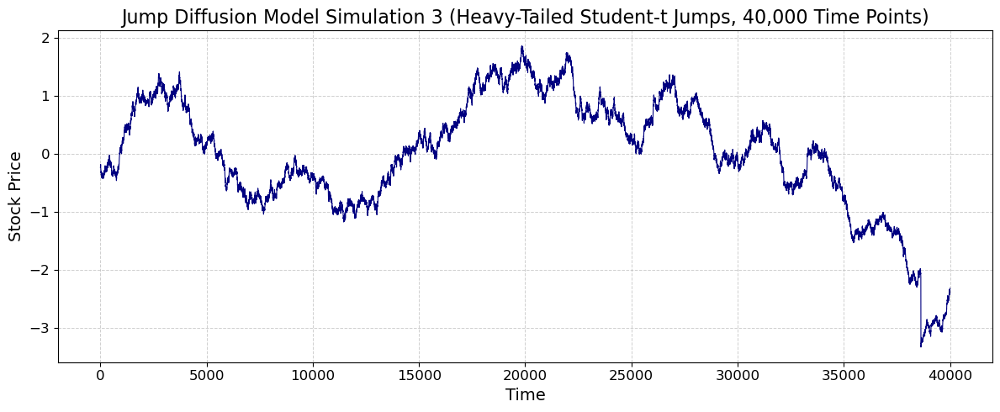

In [4]:

np.random.seed(42)

S0 = 100                # initial stock price
mu = 0.05               # drift
sigma = 0.2             # volatility
lamb = 0.5              # jump intensity
df_t = 2                # degrees of freedom for heavy-tailed t distribution
scale_t = 0.3           # scale parameter for t-distribution
T = 1.0                 # total time
N = 40000               # number of time steps
dt = T / N              # time step


t = np.arange(N)

# Brownian increments
dW = np.random.normal(0, np.sqrt(dt), N)
# Poisson jump component
N_jumps = np.random.poisson(lamb * dt, N)  # 0 or 1 jumps per step
J = np.random.standard_t(df_t, size=N) * scale_t   # heavy-tailed jump sizes (Student's t)
jump_component = (np.exp(J) - 1) * N_jumps

S = np.zeros(N)
S[0] = S0

for i in range(1, N):
    S[i] = S[i-1] * (1 + mu * dt + sigma * dW[i] + jump_component[i])

scaler = StandardScaler()
S_sd = scaler.fit_transform(S.reshape(-1, 1)).flatten()


data_jd_sd = pd.DataFrame({'x': t, 'y': S_sd})

plt.figure(figsize=(12, 5))

# Plot with publication style
plt.plot(data_jd_sd['x'], data_jd_sd['y'], color="navy", linewidth=0.8)
plt.title('Jump Diffusion Model Simulation 3 (Heavy-Tailed Student-t Jumps, 40,000 Time Points)', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Stock Price', fontsize=14)
plt.grid(True, linestyle="--", linewidth=0.7, alpha=0.6)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.tight_layout()
plt.show()

Train dataset shape: (32000,), Test dataset shape: (8000,)


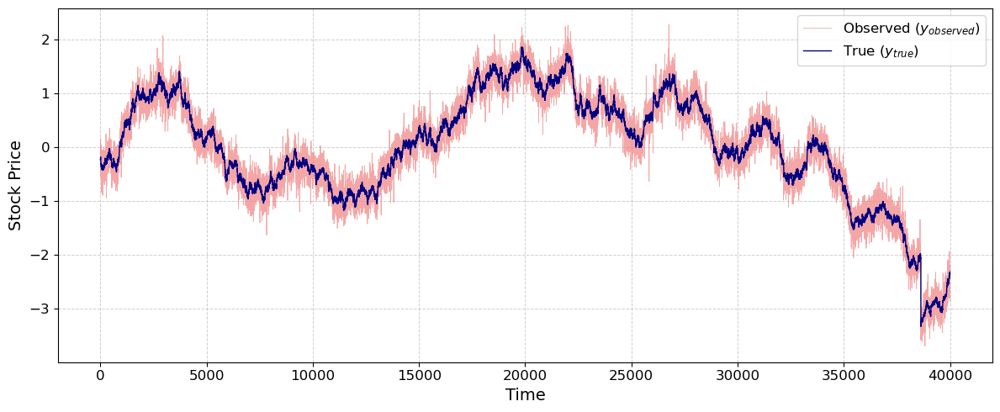

In [5]:
# Train-test split 
sigma_t = np.exp(-2 + 0.3 * np.random.normal(size=N))  # mean ≈ 0.14, clustering still present
noise = np.random.normal(0, sigma_t, size=N)
y_observed = data_jd_sd['y'] + noise 
train_size3 = int(0.8 * len(y_observed))
test_size = int(0.2 * len(y_observed))

y_train_sim3 = y_observed[:train_size3]
y_test_sim3 = y_observed[train_size3:]
y_true = data_jd_sd['y'].to_numpy()
y_true_test = data_jd_sd['y'].to_numpy()[train_size3:] 


print(f"Train dataset shape: {y_train_sim3.shape}, Test dataset shape: {y_test_sim3.shape}")

plt.figure(figsize=(12, 5))

plt.plot(data_jd_sd['x'], y_observed, 
         color="lightcoral", linewidth=0.6, alpha=0.7, 
         label="Observed ($y_{observed}$)")
plt.plot(data_jd_sd['x'], data_jd_sd['y'], 
         color="navy", linewidth=1.0, 
         label="True ($y_{true}$)")
#plt.title('Jump Diffusion Simulation 1 (Heavy-Tailed Student-t Jumps, 40,000 Steps)', fontsize=16)
plt.xlabel('Time', fontsize=14)
plt.ylabel('Stock Price', fontsize=14)
plt.grid(True, linestyle="--", linewidth=0.7, alpha=0.6)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("sim1_student_t.png", dpi=500, bbox_inches="tight")
plt.show()

# Garch (1,1)

100%|██████████| 8000/8000 [02:21<00:00, 56.34it/s] 


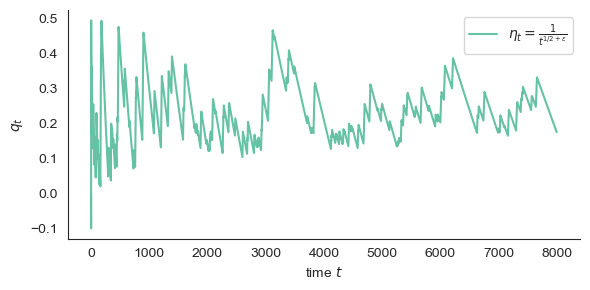

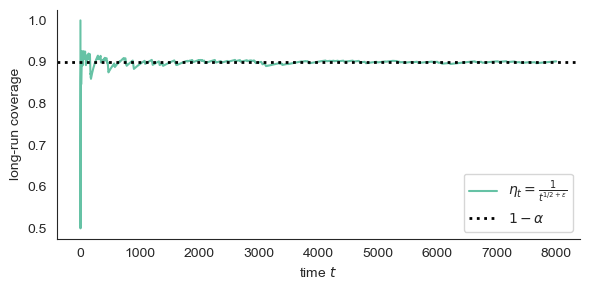

0.23512235551864774


In [6]:

def garch_forecast(data, train_size, horizon=1, refit_every=50,
                   mean='AR', lags=1, vol='GARCH', p=1, q=1, dist='t'):
    """
    Rolling GARCH forecast with optional AR mean and less frequent refits.

    Parameters:
        data (array-like): time series (e.g., returns).
        train_size (int): number of points in training set.
        horizon (int): forecast horizon (default = 1).
        refit_every (int): how often to refit the GARCH model (default=50).
        mean (str): mean model type ('Zero', 'Constant', 'AR').
        lags (int): number of AR lags if mean='AR'.
        vol (str): volatility model type ('GARCH', 'EGARCH', etc.).
        p, q (int): GARCH orders.
        dist (str): error distribution ('normal', 't', 'skewt', 'ged').

    Returns:
        np.array: mean forecasts for the test set.
    """
    data = np.asarray(data, dtype=float)
    train, test = data[:train_size], data[train_size:]
    
    preds = []
    res = None
    for t in tqdm(range(len(test))):
        if t % refit_every == 0 or res is None:
            train_subset = np.concatenate([train, test[:t]])
            model = arch_model(train_subset,
                               mean=mean, lags=lags,
                               vol=vol, p=p, q=q, dist=dist)
            res = model.fit(disp="off")
        
        forecast = res.forecast(horizon=horizon, reindex=False)
        pred = forecast.mean.iloc[-1, 0]
        preds.append(pred)
    
    return np.array(preds)

y = y_observed.to_numpy()
train_size = int(0.8 * len(y))

#GARCH(1,1) with AR(1) mean and Student-t errors
y_garch_pred = garch_forecast(y, train_size,
                       mean='AR', lags=1, p=1, q=1,
                       dist='t', refit_every=20)
results_garch = compute_coverage_metrics(
    y_true_test,
    y_garch_pred,
    alpha=0.1, epsilon=0.1, W=1000, C=1
)

plot_coverage_results(results_garch, alpha=0.1, W=1000)
print(np.mean(results_garch['q_decaying']))
CI_garch_decaying = results_garch['q_decaying'] * 2

In [7]:
print(f"coverage for garch1", np.mean(results_garch['observed_coverages_decaying']))

coverage for garch1 0.9015


# EGARCH(1,1)

100%|██████████| 8000/8000 [03:53<00:00, 34.28it/s]


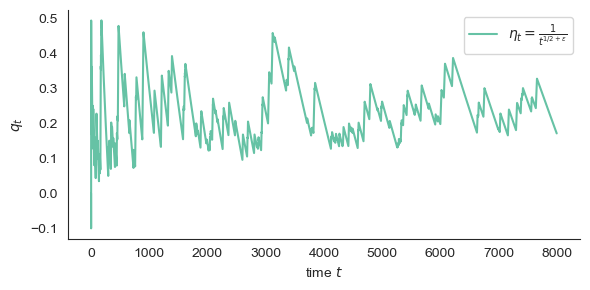

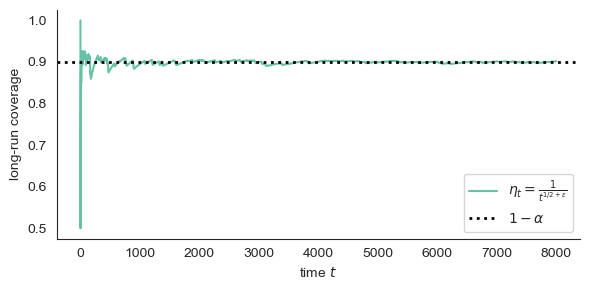

0.235500184185637


In [8]:

# EGARCH with AR(1) mean and Student-t errors
y_garch_pred2 = garch_forecast(y, train_size,
                       mean='AR', lags=1,
                       vol='EGARCH', p=1, q=1,
                       dist='t', refit_every=20)
results_garch2 = compute_coverage_metrics(
    y_true_test,
    y_garch_pred2,
    alpha=0.1, epsilon=0.1, W=1000, C=1
)

plot_coverage_results(results_garch2, alpha=0.1, W=1000)
print(np.mean(results_garch2['q_decaying']))
CI_garch_decaying2 = results_garch2['q_decaying'] * 2

In [9]:
print(f"coverage for garch2", np.mean(results_garch2['observed_coverages_decaying']))

coverage for garch2 0.901625


# GARCH(2,2)

100%|██████████| 8000/8000 [02:14<00:00, 59.56it/s] 


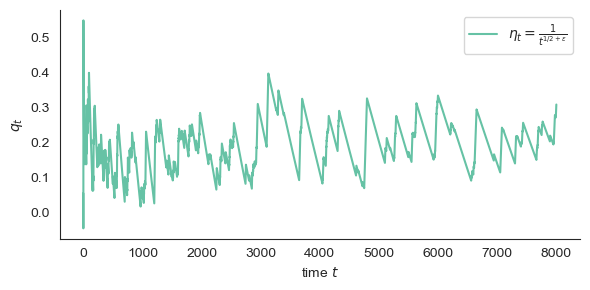

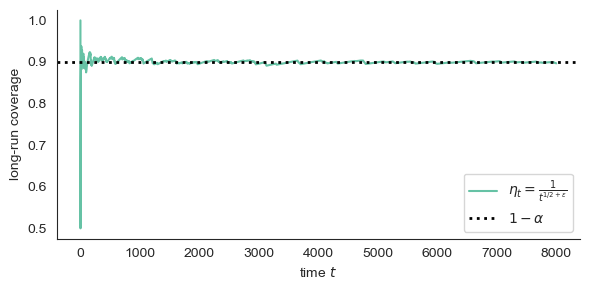

0.1932624784329889


In [10]:


# Try GARCH(2,2) with AR(2) dist='skewt'
y_garch_pred3 = garch_forecast(y, train_size,
                       mean='AR', lags=2,
                       vol='GARCH', p=2, q=2,
                       dist='skewt', refit_every=50)

results_garch3 = compute_coverage_metrics(
    y_true_test,
    y_garch_pred3,
    alpha=0.1, epsilon=0.1, W=1000, C=1
)

plot_coverage_results(results_garch3, alpha=0.1, W=1000)
print(np.mean(results_garch3['q_decaying']))
CI_garch_decaying3 = results_garch3['q_decaying'] * 2

In [11]:
print(f"coverage for garch3", np.mean(results_garch3['observed_coverages_decaying']))

coverage for garch3 0.896625


# Simple Average

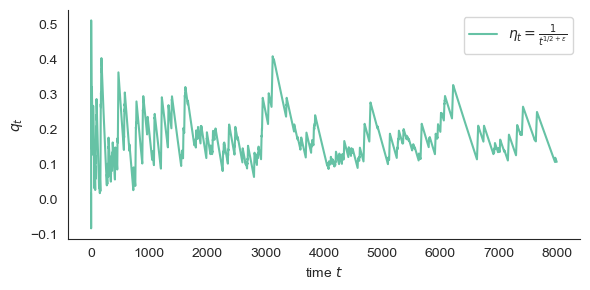

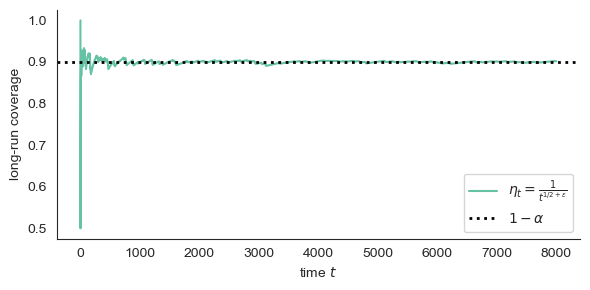

0.18035673698362548


In [12]:
simple_average_pred = simple_average_ensemble([y_garch_pred, y_garch_pred2, y_garch_pred3])
results_sa_garch = compute_coverage_metrics(y_true_test, simple_average_pred, alpha=0.1, epsilon=0.1, W=1000, C=1)
plot_coverage_results(results_sa_garch, alpha=0.1, W=1000)
print(np.mean(results_sa_garch['q_decaying']))
CI_sa_decaying = results_sa_garch['q_decaying'] * 2

# Super learner 

Fold 0: train=5335, val=5333


100%|██████████| 5333/5333 [00:24<00:00, 214.65it/s]


Fold 1: train=10668, val=5333


100%|██████████| 5333/5333 [00:36<00:00, 146.18it/s]


Fold 2: train=16001, val=5333


100%|██████████| 5333/5333 [00:40<00:00, 132.69it/s]


Fold 3: train=21334, val=5333


100%|██████████| 5333/5333 [00:52<00:00, 101.60it/s]


Fold 4: train=26667, val=5333


100%|██████████| 5333/5333 [00:58<00:00, 91.29it/s] 


First meta-learner weights: [0.20158359 0.20123392 0.5971825 ]


100%|██████████| 8000/8000 [01:28<00:00, 90.26it/s] 


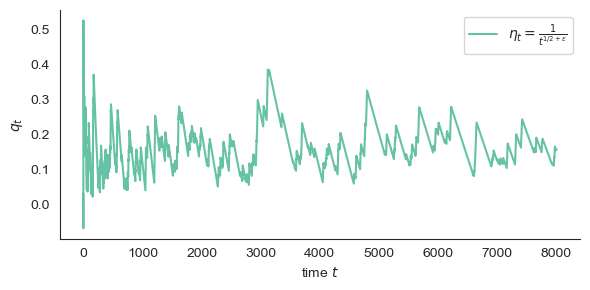

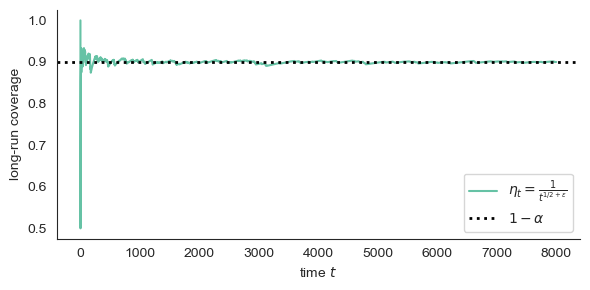

sl 0.9


In [13]:
def garch_forecast(data, train_size, horizon=1, refit_every=50,
                   mean='AR', lags=1, vol='GARCH', p=1, q=1, dist='t'):
    """
    Rolling GARCH forecast with optional AR mean and less frequent refits.

    Parameters:
        data (array-like): time series (e.g., returns).
        train_size (int): number of points in training set.
        horizon (int): forecast horizon (default = 1).
        refit_every (int): how often to refit the GARCH model (default=50).
        mean (str): mean model type ('Zero', 'Constant', 'AR').
        lags (int): number of AR lags if mean='AR'.
        vol (str): volatility model type ('GARCH', 'EGARCH', etc.).
        p, q (int): GARCH orders.
        dist (str): error distribution ('normal', 't', 'skewt', 'ged').

    Returns:
        np.array: mean forecasts for the test set.
    """
    data = np.asarray(data, dtype=float)
    train, test = data[:train_size], data[train_size:]
    
    preds = []
    res = None
    for t in tqdm(range(len(test))):
        if t % refit_every == 0 or res is None:
            train_subset = np.concatenate([train, test[:t]])
            model = arch_model(train_subset,
                               mean=mean, lags=lags,
                               vol=vol, p=p, q=q, dist=dist)
            res = model.fit(disp="off")
        
        forecast = res.forecast(horizon=horizon, reindex=False)
        pred = forecast.mean.iloc[-1, 0]
        preds.append(pred)
    
    return np.array(preds)

def optimize_weights(X, y, alpha1=0.0, alpha2=0.0):
    init_phi = np.ones(X.shape[1]) / X.shape[1]
    def mse_loss(phi):
        y_pred = X @ phi
        mse = np.mean((y - y_pred) ** 2)
        l1 = alpha1 * np.sum(np.abs(phi))
        l2 = alpha2 * np.sum(phi**2)
        return mse + l1 + l2
    constraints = [{'type': 'eq', 'fun': lambda phi: np.sum(phi) - 1}]
    bounds = [(0, 1)] * X.shape[1]
    result = minimize(mse_loss, init_phi, bounds=bounds, constraints=constraints)
    return result.x


def super_learner_garch(y, n_splits=5, refit_every=20):
    """
    Super Learner with 3 base GARCH learners: (1,1), (2,2), (3,3).
    Uses the same rolling garch_forecast() as standalone.
    """
    n_total = len(y)
    train_size = int(0.8 * n_total)
    y_train, y_test = y[:train_size], y[train_size:]

    tscv = TimeSeriesSplit(n_splits=n_splits)
    meta_features = np.full((train_size, 3), np.nan)

    # Cross Validation 
    for fold, (train_idx, val_idx) in enumerate(tscv.split(y_train)):
        print(f"Fold {fold}: train={len(train_idx)}, val={len(val_idx)}")
        cv_data = y_train[:max(val_idx) + 1]

        preds1 = garch_forecast(cv_data, len(train_idx),
                                mean='AR', lags=1, p=1, q=1, dist='t',
                                refit_every=refit_every)
        preds2 = garch_forecast(cv_data, len(train_idx),
                                lags=1, vol='EGARCH', p=1, q=1,
                                dist='t', refit_every=20)
        preds3 = garch_forecast(cv_data, len(train_idx),
                                mean='AR', lags=2, vol='GARCH', p=2, q=2, dist='skewt', refit_every=50)

        meta_features[val_idx, 0] = preds1[-len(val_idx):]
        meta_features[val_idx, 1] = preds2[-len(val_idx):]
        meta_features[val_idx, 2] = preds3[-len(val_idx):]

    valid_rows = ~np.isnan(meta_features).any(axis=1)
    X_meta = meta_features[valid_rows]
    y_meta = y_train[valid_rows]

    # meta-learner weights
    meta_weights = optimize_weights(X_meta, y_meta)
    print("First meta-learner weights:", meta_weights)
    # Retrain on the full dataset 
    garch_full1 = garch_forecast(y, train_size,
                                 mean='AR', lags=1, p=1, q=1, dist='t',
                                 refit_every=refit_every)
    garch_full2 = garch_forecast(y, train_size,
                                  mean='AR', lags=1, vol='EGARCH', p=1, q=1,
                                  dist='t', refit_every=20)
    garch_full3 = garch_forecast(y, train_size,
                                  mean='AR', lags=2, vol='GARCH', p=2, q=2, dist='skewt', refit_every=50)

    X_test_meta = np.column_stack([garch_full1, garch_full2, garch_full3])
    T_test = len(y_test)
    super_preds = np.zeros(T_test)
    weights_hist = np.zeros((T_test, 3))
    w = meta_weights.copy() 
    # NNLS with online updating 
    for t in range(T_test):
        # update weight using past only (0..t-1)
        if t > 0:
            w = optimize_weights(X_test_meta[:t], y_test[:t])

        super_preds[t] = X_test_meta[t] @ w
        weights_hist[t] = w

    return super_preds, weights_hist

y = y_observed.to_numpy()
super_preds, weights_hist = super_learner_garch(y, n_splits=5)

# Evaluate coverage
results_sl = compute_coverage_metrics(
    y_true_test, super_preds,
    alpha=0.1, epsilon=0.1, W=1000, C=1
)
plot_coverage_results(results_sl, alpha=0.1, W=1000)
print(f"sl", np.mean(results_sl['observed_coverages_decaying']))

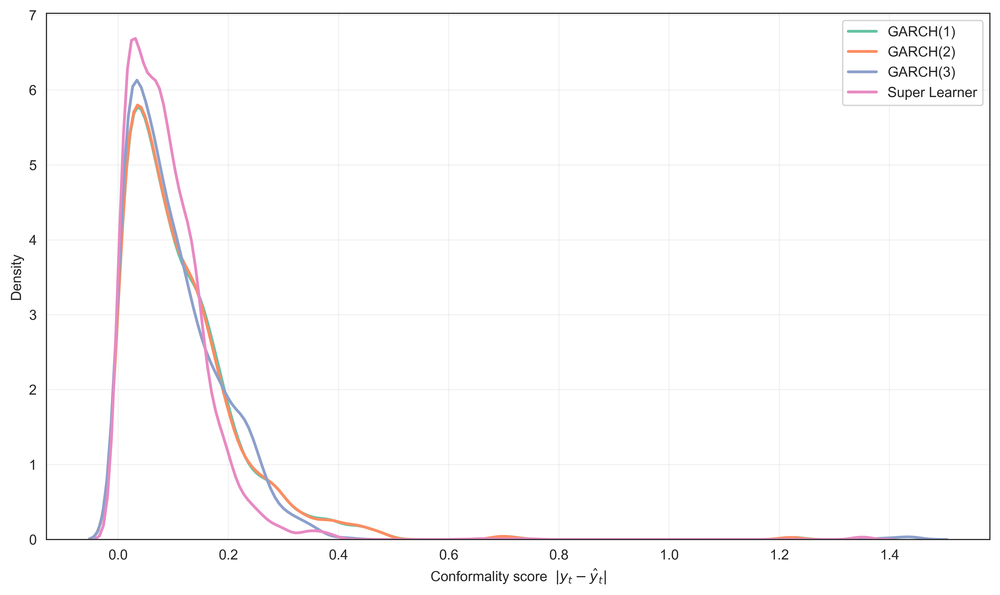

In [14]:

# Conformality scores
score_garch1 = np.abs(y_true_test - y_garch_pred)
score_garch2 = np.abs(y_true_test - y_garch_pred2)
score_garch3 = np.abs(y_true_test - y_garch_pred3)
score_sl = np.abs(y_true_test - super_preds)

plt.figure(figsize=(10, 6), dpi=500)

sns.kdeplot(score_garch1, label="GARCH(1)", linewidth=2)
sns.kdeplot(score_garch2, label="GARCH(2)", linewidth=2)
sns.kdeplot(score_garch3, label="GARCH(3)", linewidth=2)
sns.kdeplot(score_sl, label="Super Learner", linewidth=2)

plt.xlabel("Conformality score  $|y_t - \hat y_t|$")
plt.ylabel("Density")
#plt.title("Sim1 (ARCH): Density of Conformality Scores")
plt.legend()
plt.grid(alpha=0.25)

plt.tight_layout()
plt.savefig("arch1_score_density.png", dpi=500, bbox_inches="tight")
plt.show()

0.16555427345600363


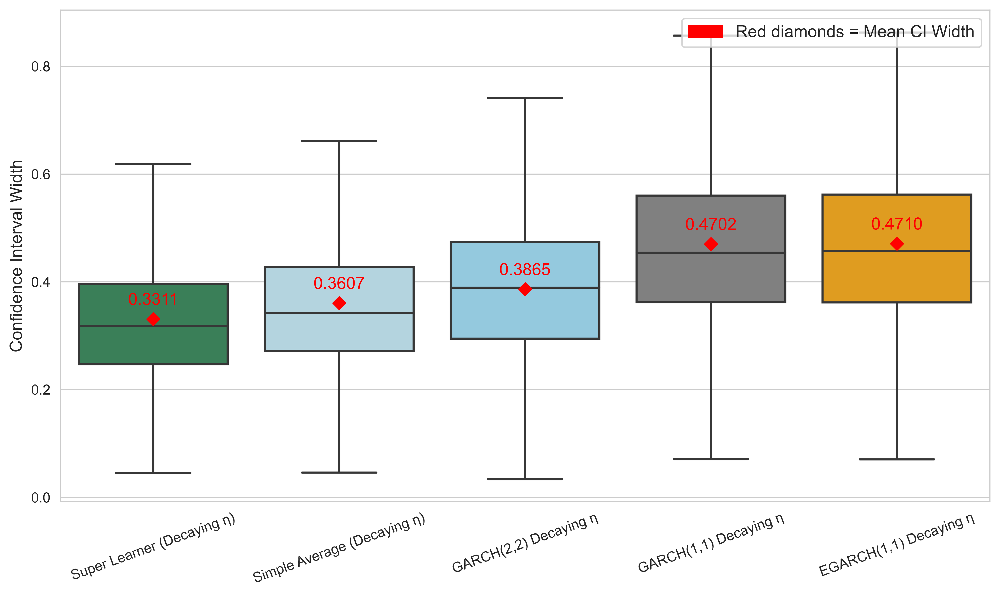

In [40]:
CI_sp_decaying = results_sl['q_decaying'] * 2 
print(np.mean(results_sl['q_decaying']))

data_dict = {
    "GARCH(1,1) Decaying η": CI_garch_decaying,
    "EGARCH(1,1) Decaying η": CI_garch_decaying2,
    "GARCH(2,2) Decaying η": CI_garch_decaying3,
    "Simple Average (Decaying η)": CI_sa_decaying,
    "Super Learner (Decaying η)": CI_sp_decaying
}

df_box = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in data_dict.items()]))
df_long = df_box.melt(var_name="Method", value_name="CI Width")
order = df_long.groupby("Method")["CI Width"].median().sort_values().index
plt.figure(figsize=(10, 6), dpi=500)
sns.set_style("whitegrid")
palette = {
    "GARCH(1,1) Decaying η": "gray",
    "EGARCH(1,1) Decaying η": "orange",
    "GARCH(2,2) Decaying η": "skyblue",
    "Simple Average (Decaying η)": "lightblue",
    "Super Learner (Decaying η)": "seagreen"
}

ax = sns.boxplot(x="Method", y="CI Width", data=df_long, order=order,
                 palette=palette, showfliers=False)

means = df_long.groupby("Method")["CI Width"].mean()
for i, method in enumerate(order):
    ax.scatter(i, means[method], color="red", marker="D", s=40, zorder=3)
    ax.text(i, means[method]+0.02, f"{means[method]:.4f}",
            ha='center', va='bottom', fontsize=12, color="red")

mean_patch = mpatches.Patch(color='red', label='Red diamonds = Mean CI Width')
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles + [mean_patch], labels + ['Red diamonds = Mean CI Width'],
          loc='upper right', fontsize=12, frameon=True)

#plt.title("Sim1 (ARCH): Comparison of Confidence Interval Widths Across Methods", fontsize=14)
plt.xlabel("")
plt.ylabel("Confidence Interval Width", fontsize=12)
plt.xticks(rotation=20)
plt.tight_layout()
plt.savefig("arch1_CI_comparison.png", dpi=500, bbox_inches="tight")
plt.show()



# COMA 

## Adahedge

### COMA v.s. SL 

Mean deterministic coverage: 0.89475
Mean randomized coverage: 0.894625
Mean CI width — COMA (det): 0.3865857525484636
Mean CI width — COMA (rand): 0.38657374871904915
Mean CI width — Super Learner: 0.33110854691200725


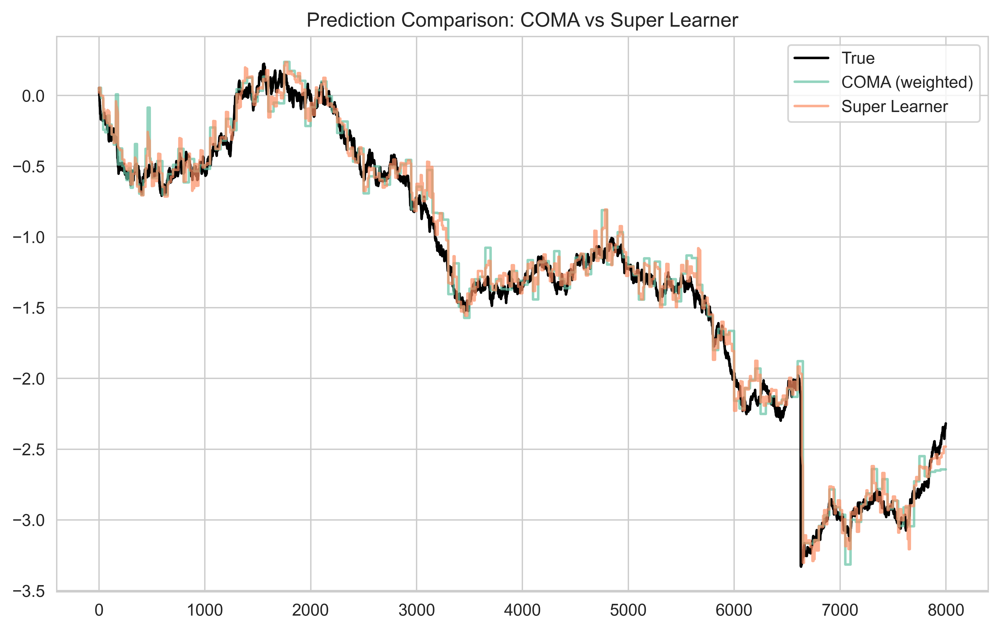

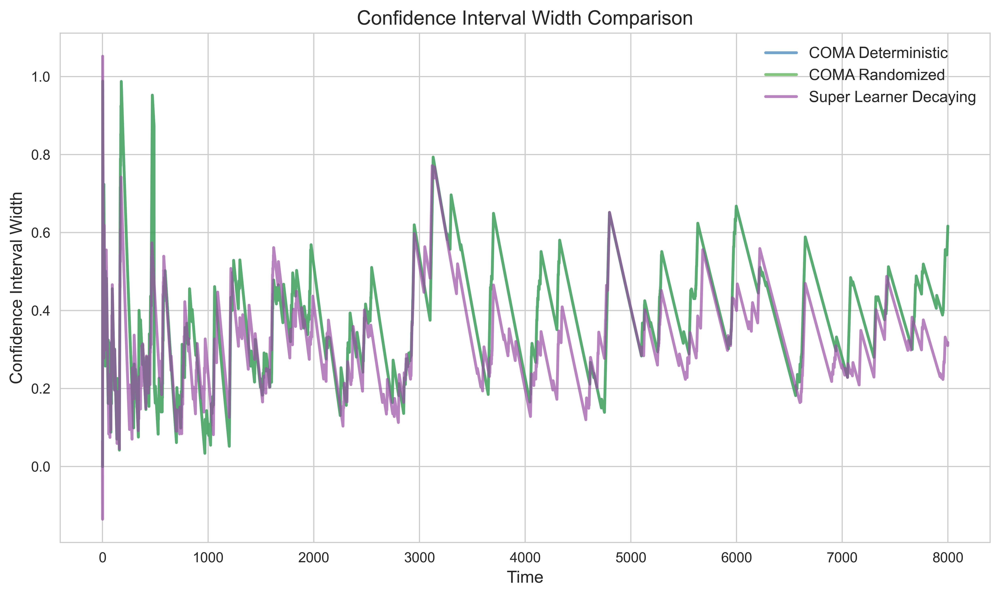

In [ ]:
colors = sns.color_palette("Set1", 4)
min_len = min(
    len(results_garch['q_decaying']),
    len(results_garch2['q_decaying']),
    len(results_garch3['q_decaying']),
    len(CI_sa_decaying),
    len(CI_sp_decaying),
    len(y_true_test)
)

ci_matrix = np.column_stack([
    CI_garch_decaying[-min_len:],
    CI_garch_decaying2[-min_len:],
    CI_garch_decaying3[-min_len:],
])
adahedAlg = adahedge(loss_matrix=ci_matrix)

intervals_garch = np.column_stack([
    y_garch_pred[-min_len:] 
    - results_garch['q_decaying'][-min_len:],
    y_garch_pred[-min_len:] 
    + results_garch['q_decaying'][-min_len:]
])

intervals_garch2 = np.column_stack([
    y_garch_pred2[-min_len:] - results_garch2['q_decaying'][-min_len:],
    y_garch_pred2[-min_len:] + results_garch2['q_decaying'][-min_len:]
])

intervals_garch3 = np.column_stack([
    y_garch_pred3[-min_len:] - results_garch3['q_decaying'][-min_len:],
    y_garch_pred3[-min_len:] + results_garch3['q_decaying'][-min_len:]
])


intervals_list_plain = [intervals_garch, intervals_garch2, intervals_garch3]
weights_plain = adahedAlg["weights"]

y_test_aligned = y_true_test[-min_len:]
result_plain = coma_loop(intervals_list_plain, weights_plain, y_test_aligned)

print("Mean deterministic coverage:", result_plain["mean_m_cov"])
print("Mean randomized coverage:", result_plain["mean_wm_cov"])

pi_m   = result_plain["pi_m"]
pi_wm  = result_plain["pi_wm"]

coma_width_det  = np.array([loss_fun(ci) for ci in pi_m])
coma_width_rand = np.array([loss_fun(ci) for ci in pi_wm])

CI_super_decaying = CI_sp_decaying[-min_len:]

print("Mean CI width — COMA (det):", np.nanmean(coma_width_det))
print("Mean CI width — COMA (rand):", np.nanmean(coma_width_rand))
print("Mean CI width — Super Learner:", np.mean(CI_super_decaying))

base_preds_matrix = np.column_stack([
    y_garch_pred[-min_len:],
    y_garch_pred2[-min_len:],
    y_garch_pred3[-min_len:]
])

coma_preds_weighted = np.sum(base_preds_matrix * weights_plain, axis=1)

plt.figure(figsize=(10, 6), dpi=500)
plt.plot(y_test_aligned, label="True", color="black")
plt.plot(coma_preds_weighted, label="COMA", alpha=0.7)
plt.plot(super_preds[-min_len:], label="Super Learner", alpha=0.7)
plt.legend()
plt.title("Prediction Comparison: COMA vs Super Learner")
plt.show()

plt.figure(figsize=(10, 6), dpi=500)

plt.plot(coma_width_rand, label='COMA', linewidth=2, alpha = 0.7, color=colors[2])
plt.plot(CI_super_decaying, label='Super Learner', linewidth=2, alpha = 0.7, color=colors[3])

plt.xlabel('Time', fontsize=12)
plt.ylabel('Confidence Interval Width', fontsize=12)
plt.title('Confidence Interval Width Comparison', fontsize=14)

plt.legend(frameon=False, fontsize=11, loc='upper right')
plt.tight_layout()
plt.show()


#### smooth 

Mean CI width — COMA(base, rand): 0.3867098677015697
Mean CI width — SL: 0.33405992193632605


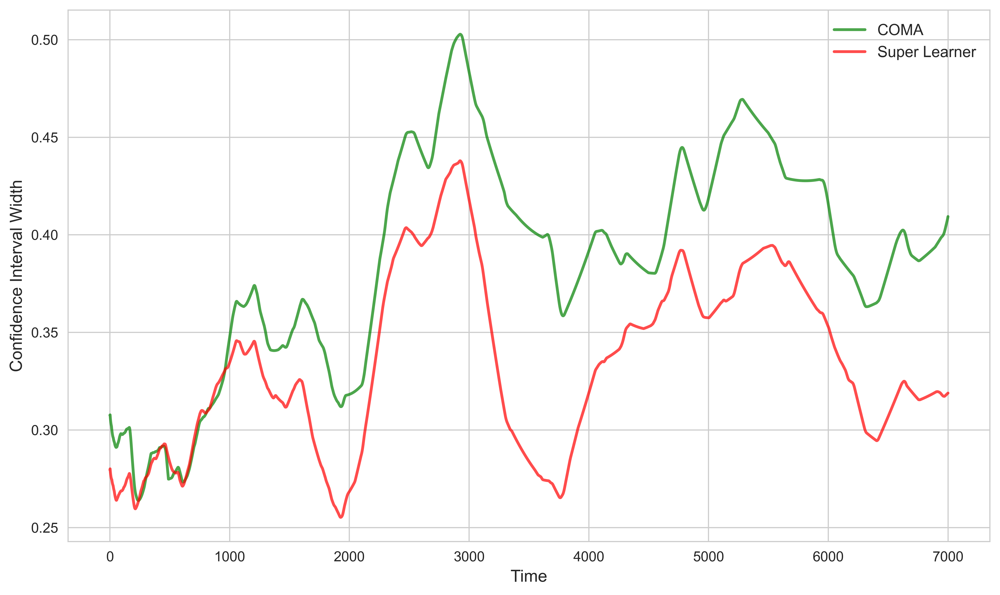

In [85]:

#coma_width_det_smooth     = smooth_series(coma_width_det, window=1000)
coma_width_rand_smooth    = smooth_series(coma_width_rand, window=1000)
sl_smooth = smooth_series(CI_super_decaying, window=1000)   

#print("Mean CI width — COMA(base, det):", np.nanmean(coma_width_det_smooth))
print("Mean CI width — COMA(base, rand):", np.nanmean(coma_width_rand_smooth))
print("Mean CI width — SL:", np.nanmean(sl_smooth))

plt.figure(figsize=(10, 6), dpi=500)
#plt.plot(coma_width_det_smooth, label='COMA Deterministic', linewidth=2, alpha = 0.7, color='blue')
plt.plot(coma_width_rand_smooth, label='COMA', linewidth=2, alpha = 0.7, color='green')
plt.plot(sl_smooth, label='Super Learner', linewidth=2, alpha = 0.7, color='red')

plt.xlabel('Time', fontsize=12)
plt.ylabel('Confidence Interval Width', fontsize=12)
#plt.title("Sim1 (ARCH, Adahedge, Smoothed): CI Widths — COMA(base) vs Super Learner", fontsize=14)

plt.legend(frameon=False, fontsize=11, loc='upper right')
plt.tight_layout()
plt.savefig("arch1_adahedge_smooth_line_base.png", dpi=500, bbox_inches="tight")
plt.show()


### COMA v.s COMA (base + SL)

Mean coverage: 0.898625
Mean CI width — COMA: 0.3865736330751103
Mean CI width — COMA + SL: 0.33079386861814575


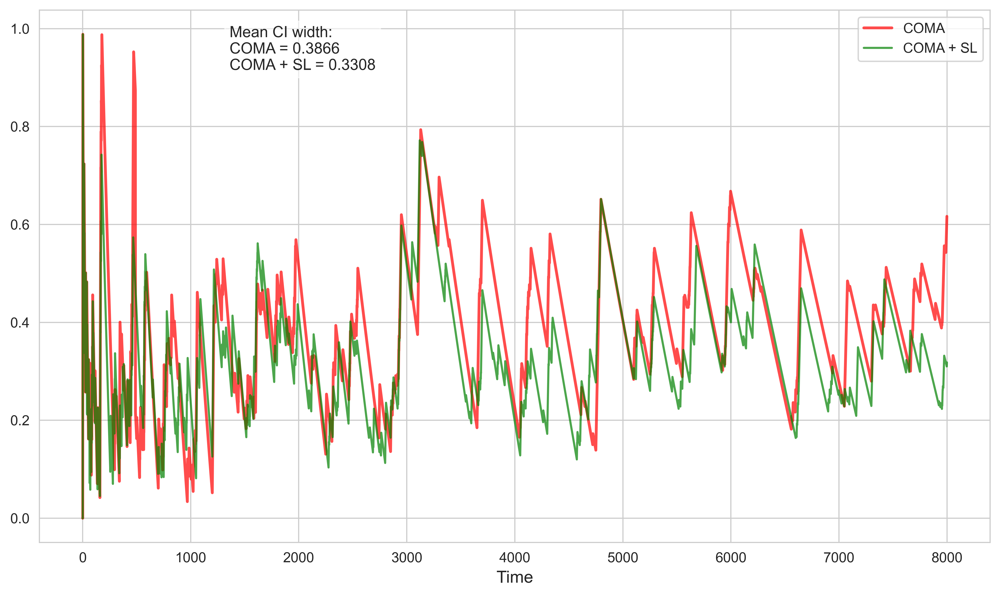

In [86]:

min_len = min(
    len(results_garch['q_decaying']),
    len(results_garch2['q_decaying']),
    len(results_garch['q_decaying']),
    len(results_sl['q_decaying']),
    len(y_true_test)
)

ci_matrix_sl = np.column_stack([
    CI_garch_decaying[-min_len:],
    CI_garch_decaying2[-min_len:],
    CI_garch_decaying3[-min_len:],
    CI_sp_decaying[-min_len:]
])

adahedAlg_sl = adahedge(loss_matrix=ci_matrix_sl)


intervals_sp = np.column_stack([
    super_preds[-min_len:] - results_sl['q_decaying'][-min_len:],
    super_preds[-min_len:] + results_sl['q_decaying'][-min_len:]
])

intervals_list_sl = [intervals_garch, intervals_garch2, intervals_garch3, intervals_sp]
weights_sl = adahedAlg_sl["weights"]

y_test_aligned = y_true_test[-min_len:]

result_sl = coma_loop(intervals_list_sl, weights_sl, y_test_aligned)

print("Mean coverage:", result_sl["mean_wm_cov"])


intervals_list_plain = [intervals_garch, intervals_garch2, intervals_garch3]
weights_plain = adahedAlg["weights"]


y_test_aligned = y_true_test[-min_len:]


result_plain = coma_loop(intervals_list_plain, weights_plain, y_test_aligned)
pi_wm_plain  = result_plain["pi_wm"]
coma_width_rand = np.array([loss_fun(ci) for ci in pi_wm_plain])

pi_wm_sl  = result_sl["pi_wm"]

coma_width_rand_sl = np.array([loss_fun(ci) for ci in pi_wm_sl])
print("Mean CI width — COMA:", np.nanmean(coma_width_rand))
print("Mean CI width — COMA + SL:", np.nanmean(coma_width_rand_sl))

# Randomized subplot 
plt.figure(figsize=(10, 6), dpi=500)
plt.plot(coma_width_rand, label='COMA', linewidth=2, alpha=0.7, color='red')
plt.plot(coma_width_rand_sl, label='COMA + SL', linewidth=1.5, alpha=0.7, color='green')
#plt.title("$\\rho \\in (0.5,1.0)$", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.legend()

mean_rand = np.nanmean(coma_width_rand)
mean_rand_sl = np.nanmean(coma_width_rand_sl)
plt.text(0.2, 0.97,
         f"Mean CI width:\nCOMA = {mean_rand:.4f}\nCOMA + SL = {mean_rand_sl:.4f}",
         transform=plt.gca().transAxes,
             fontsize=11, verticalalignment="top",
             bbox=dict(boxstyle="round", facecolor="white", alpha=0.6))

#plt.suptitle("Sim1 (ARCH, Adahedge): Confidence Interval Widths: COMA(base) vs COMA(base+Super Learner)", fontsize=14)
plt.tight_layout()
plt.savefig("arch1_adahedge_line_comasl.png", dpi=500, bbox_inches="tight")
plt.show()

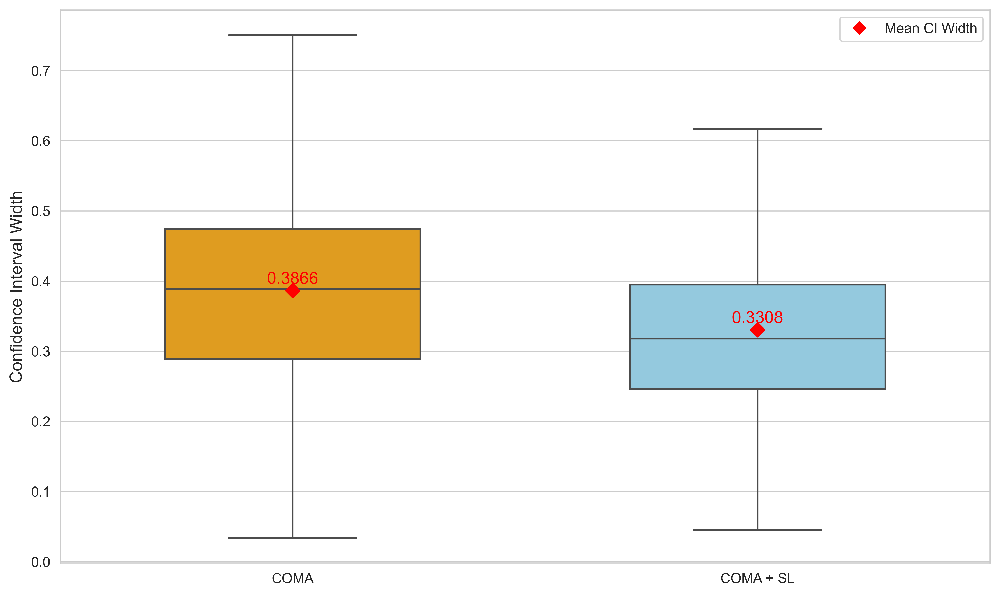

In [87]:

data_dict = {
    "COMA Deterministic (base)": coma_width_det,
    "COMA": coma_width_rand,
    "COMA + SL": coma_width_rand_sl
}

df_box = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in data_dict.items()]))
df_long = df_box.melt(var_name="Method", value_name="CI Width")

rand_methods = ["COMA", "COMA + SL"]

palette = {"COMA": "orange",
           "COMA + SL": "skyblue"}


plt.figure(figsize=(10, 6), dpi=500)

# Boxplot (randomized methods only)
sns.boxplot(
    x="Method",
    y="CI Width",
    data=df_long[df_long["Method"].isin(rand_methods)],
    order=rand_methods,
    palette=palette,
    showfliers=False,
    width=0.55,
    linewidth=1.2
)

# Mean CI width (red diamonds)
means_rand = [np.nanmean(data_dict[m]) for m in rand_methods]
for i, m in enumerate(rand_methods):
    plt.scatter(i, means_rand[i], color="red", marker="D", s=50, zorder=3)
    plt.text(
        i,
        means_rand[i] + 0.005,
        f"{means_rand[i]:.4f}",
        ha="center",
        va="bottom",
        fontsize=12,
        color="red"
    )

# Labels and title
#plt.title(r"Randomized COMA ($\rho \sim \mathrm{Unif}(0.5,1.0)$)", fontsize=13)
plt.xlabel("")
plt.ylabel("Confidence Interval Width", fontsize=12)

# Legend (mean marker only)
plt.legend(
    handles=[plt.Line2D([0], [0], color="red", marker="D",
                        linestyle="", label="Mean CI Width")],
    loc="upper right"
)

plt.tight_layout()
plt.savefig("arch1_adahedge_boxplot_comasl_randomized.png",
            dpi=500, bbox_inches="tight")
plt.show()

#### smooth

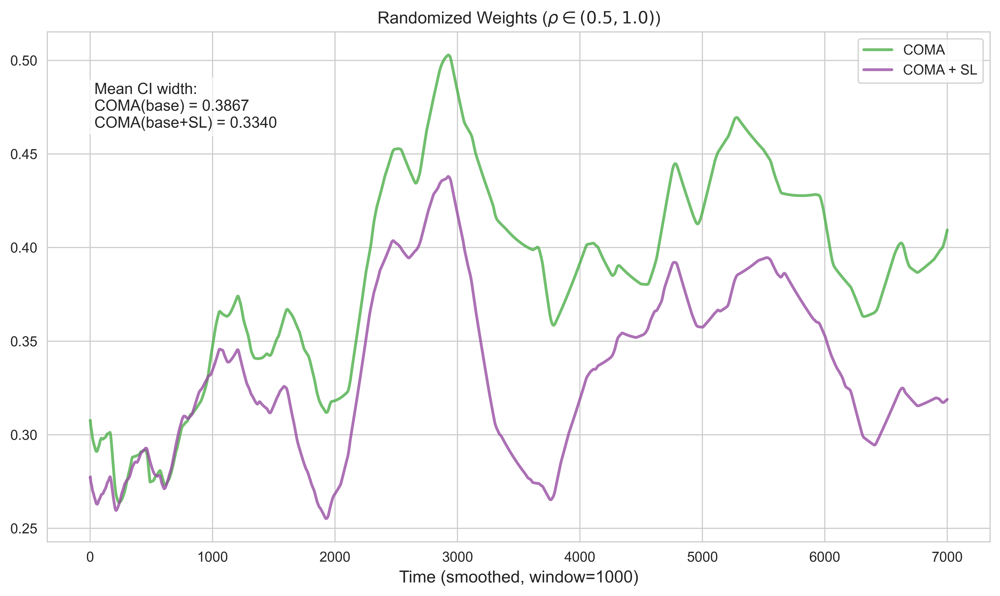

In [88]:

coma_width_rand_smooth    = smooth_series(coma_width_rand, window=1000)
coma_width_rand_sl_smooth = smooth_series(coma_width_rand_sl, window=1000)

# Randomized subplot 
plt.figure(figsize=(10, 6), dpi=500)
plt.plot(coma_width_rand_smooth, label='COMA', linewidth=2, alpha=0.8, color=colors[2])
plt.plot(coma_width_rand_sl_smooth, label='COMA + SL', linewidth=2, alpha=0.8, color=colors[3])
plt.title("Randomized Weights ($\\rho \\in (0.5,1.0)$)", fontsize=12)
plt.xlabel("Time (smoothed, window=1000)", fontsize=12)
plt.legend()
mean_rand = np.nanmean(coma_width_rand_smooth)
mean_rand_sl = np.nanmean(coma_width_rand_sl_smooth)
plt.text(0.05,0.9,
         f"Mean CI width:\nCOMA(base) = {mean_rand:.4f}\nCOMA(base+SL) = {mean_rand_sl:.4f}",
         transform=plt.gca().transAxes,
         fontsize=11, verticalalignment="top",
             bbox=dict(boxstyle="round", facecolor="white", alpha=0.6))

#plt.suptitle("Sim1 (ARCH, Adahedge, Smoothed): CI Widths — COMA(base) vs COMA+Super Learner", fontsize=14)
plt.tight_layout()
plt.savefig("arch1_adahedge_smooth_line_comasl.png", dpi=500, bbox_inches="tight")
plt.show()

## Hedge 

### coma v.s. sl 

Mean randomized coverage (COMA base): 0.89275
Mean randomized coverage (COMA+SL): 0.896625
Mean CI width — COMA(base, rand): 0.3832264291465493
Mean CI width — COMA(base+SL, rand): 0.3288225055539917


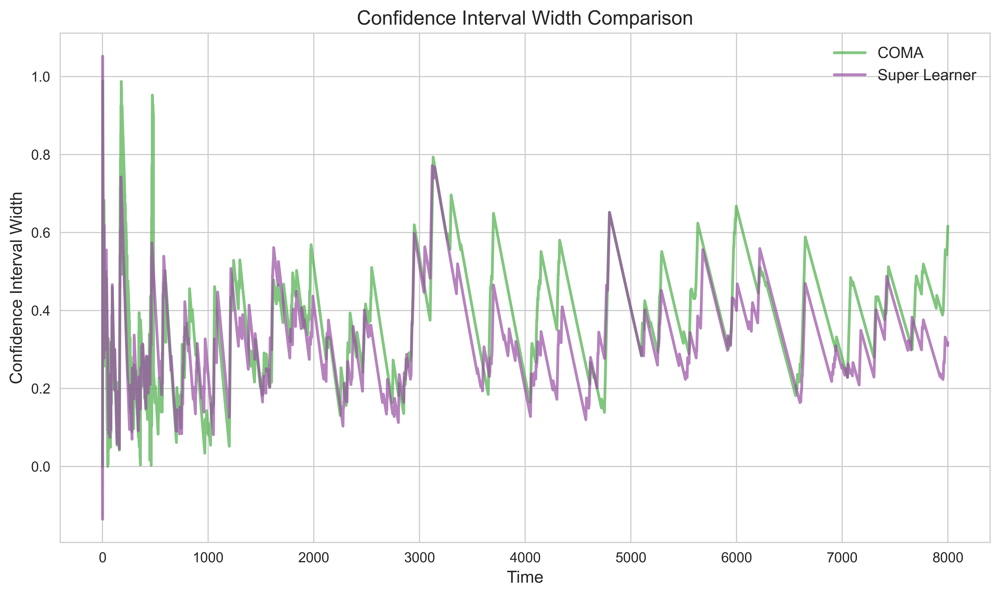

Mean CI width — COMA(base, rand): 0.3855722825899927
Mean CI width — SL: 0.33405992193632605


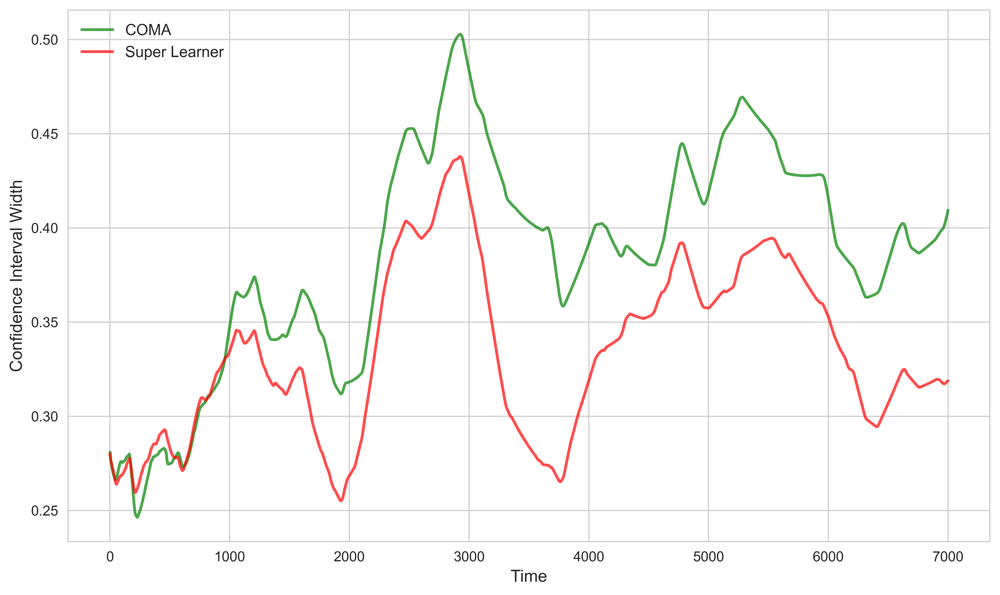

In [89]:

hedAlg_base = hedge(ci_matrix, eta=0.1)        # shape (N,3)
hedAlg_sl   = hedge(ci_matrix_sl, eta=0.1)     # shape (N,4)

weights_base = hedAlg_base["weights"]
weights_sl   = hedAlg_sl["weights"]

N_base, K_base = weights_base.shape
N_sl, K_sl     = weights_sl.shape


min_len = min(len(y_true_test), N_base, N_sl)
y_test_aligned = y_true_test[-min_len:]

pi_wm_base = []
pi_wm_sl = []

wm_cov_base = np.full(min_len, np.nan)
wm_cov_sl  = np.full(min_len, np.nan)

for i in range(min_len):
    rho_rand = np.random.uniform(0.5,1.0)

    # Base (3 experts) 
    conf_base = np.vstack([intervals_list_plain[j][i] for j in range(3)])
    wmaj_int_base = majority_vote(conf_base, w=weights_base[i], rho=rho_rand)
    pi_wm_base.append(wmaj_int_base)
    wm_cov_base[i] = covr_fun(wmaj_int_base, y_test_aligned[i])

    # Base+SL (4 experts) 
    conf_sl = np.vstack([intervals_list_sl[j][i] for j in range(4)])
    wmaj_int_sl = majority_vote(conf_sl, w=weights_sl[i], rho=rho_rand)  # same rho_rand

    pi_wm_sl.append(wmaj_int_sl)
    wm_cov_sl[i] = covr_fun(wmaj_int_sl, y_test_aligned[i])

coma_width_rand    = np.array([loss_fun(ci) for ci in pi_wm_base])
coma_width_rand_sl = np.array([loss_fun(ci) for ci in pi_wm_sl])


print("Mean randomized coverage (COMA base):", np.nanmean(wm_cov_base))
print("Mean randomized coverage (COMA+SL):", np.nanmean(wm_cov_sl))

print("Mean CI width — COMA(base, rand):", np.nanmean(coma_width_rand))
print("Mean CI width — COMA(base+SL, rand):", np.nanmean(coma_width_rand_sl))

# plot (coma v.s sl)
plt.figure(figsize=(10, 6), dpi=500)

plt.plot(coma_width_rand, label='COMA', linewidth=2, alpha=0.7, color=colors[2])
plt.plot(CI_sp_decaying, label='Super Learner', linewidth=2, alpha=0.7, color=colors[3])

plt.xlabel('Time', fontsize=12)
plt.ylabel('Confidence Interval Width', fontsize=12)
plt.title('Confidence Interval Width Comparison', fontsize=14)

plt.legend(frameon=False, fontsize=11, loc='upper right')
plt.tight_layout()
plt.show()

# plot (coma v.s. sl smoother)
coma_width_rand_smooth    = smooth_series(coma_width_rand, window=1000)
sl_smooth = smooth_series(CI_super_decaying, window=1000)   

print("Mean CI width — COMA(base, rand):", np.nanmean(coma_width_rand_smooth))
print("Mean CI width — SL:", np.nanmean(sl_smooth))

plt.figure(figsize=(10, 6), dpi=500)
plt.plot(coma_width_rand_smooth, label='COMA', linewidth=2, alpha = 0.7, color='green')
plt.plot(sl_smooth, label='Super Learner', linewidth=2, alpha = 0.7, color='red')

plt.xlabel('Time', fontsize=12)
plt.ylabel('Confidence Interval Width', fontsize=12)
#plt.title("Sim1 (ARCH, Adahedge, Smoothed): CI Widths — COMA(base) vs Super Learner", fontsize=14)

plt.legend(frameon=False, fontsize=11, loc='upper left')
plt.tight_layout()
plt.savefig("arch1_hedge_smooth_line_base.png", dpi=500, bbox_inches="tight")
plt.show()

### coma v.s coma+sl

Mean coverage (COMA): 0.89275
Mean coverage (COMA + SL): 0.896625
Mean CI width — COMA): 0.3832264291465493
Mean CI width — COMA + SL: 0.3288225055539917


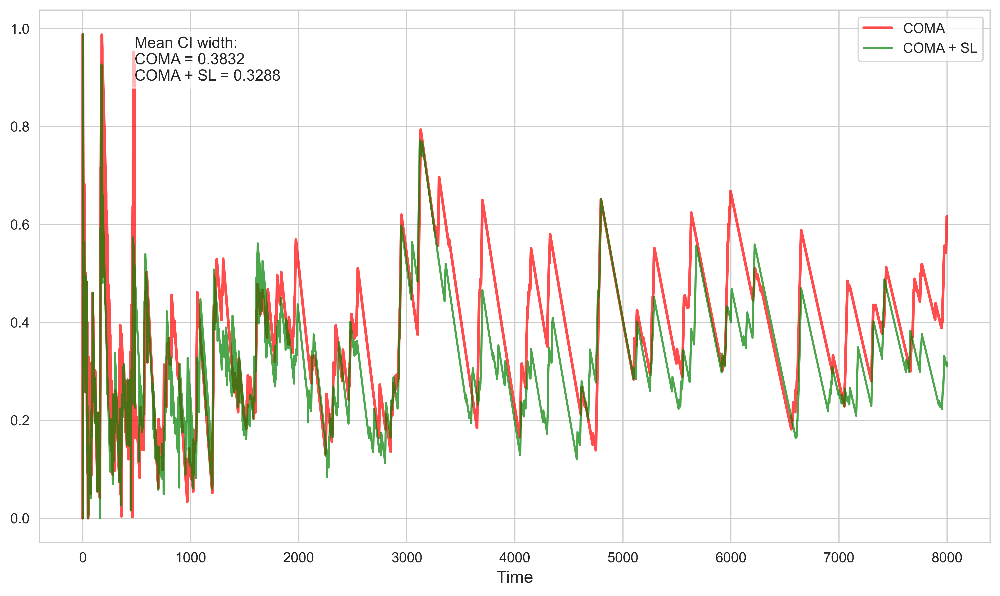

In [90]:

coma_width_rand    = np.array([loss_fun(ci) for ci in pi_wm_base])
coma_width_rand_sl = np.array([loss_fun(ci) for ci in pi_wm_sl])


print("Mean coverage (COMA):", np.nanmean(wm_cov_base))
print("Mean coverage (COMA + SL):", np.nanmean(wm_cov_sl))

print("Mean CI width — COMA):", np.nanmean(coma_width_rand))
print("Mean CI width — COMA + SL:", np.nanmean(coma_width_rand_sl))


#  Randomized subplot
plt.figure(figsize=(10, 6), dpi=500)
plt.plot(coma_width_rand, label='COMA', linewidth=2, alpha=0.7, color='red')
plt.plot(coma_width_rand_sl, label='COMA + SL', linewidth=1.5, alpha=0.7, color='green')
#plt.title("$\\rho \\in (0.5,1.0)$", fontsize=12)
plt.xlabel("Time", fontsize=12)
plt.legend()

# Annotate means
mean_rand = np.nanmean(coma_width_rand)
mean_rand_sl = np.nanmean(coma_width_rand_sl)
plt.text(0.1, 0.95,
         f"Mean CI width:\nCOMA = {mean_rand:.4f}\nCOMA + SL = {mean_rand_sl:.4f}",
         transform=plt.gca().transAxes,
             fontsize=11, verticalalignment="top",
             bbox=dict(boxstyle="round", facecolor="white", alpha=0.6))

#plt.suptitle("Sim1 (ARCH, Hedge): Confidence Interval Widths — COMA(base) vs COMA+Super Learner", fontsize=14)
plt.tight_layout()
plt.savefig("arch1_hedge_line_comasl.png", dpi=500, bbox_inches="tight")
plt.show()

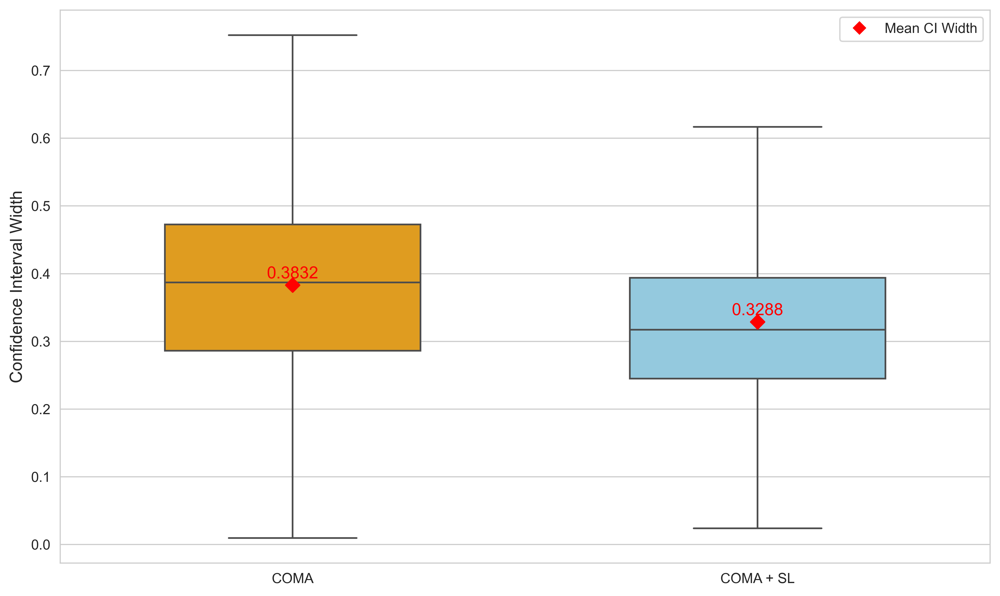

In [91]:
data_dict = {
    "COMA": coma_width_rand,
    "COMA + SL": coma_width_rand_sl
}

df_box = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in data_dict.items()]))
df_long = df_box.melt(var_name="Method", value_name="CI Width")
rand_methods = ["COMA", "COMA + SL"]

palette = {"COMA": "orange",
           "COMA + SL": "skyblue"}

plt.figure(figsize=(10, 6), dpi=500)

# Boxplot (randomized methods only)
sns.boxplot(
    x="Method",
    y="CI Width",
    data=df_long[df_long["Method"].isin(rand_methods)],
    order=rand_methods,
    palette=palette,
    showfliers=False,
    width=0.55,
    linewidth=1.2
)

# Mean CI width (red diamonds)
means_rand = [np.nanmean(data_dict[m]) for m in rand_methods]
for i, m in enumerate(rand_methods):
    plt.scatter(i, means_rand[i], color="red", marker="D", s=50, zorder=3)
    plt.text(
        i,
        means_rand[i] + 0.005,
        f"{means_rand[i]:.4f}",
        ha="center",
        va="bottom",
        fontsize=12,
        color="red"
    )

plt.xlabel("")
plt.ylabel("Confidence Interval Width", fontsize=12)
plt.legend(
    handles=[plt.Line2D([0], [0], color="red", marker="D",
                        linestyle="", label="Mean CI Width")],
    loc="upper right"
)

#plt.suptitle("Sim1 (ARCH, Hedge): Boxplot of CI Widths — COMA(base) vs COMA+Super Learner", fontsize=14)
plt.tight_layout()
plt.savefig("arch1_hedge_boxplot_comasl.png", dpi=500, bbox_inches="tight")
plt.show()

#### smooth

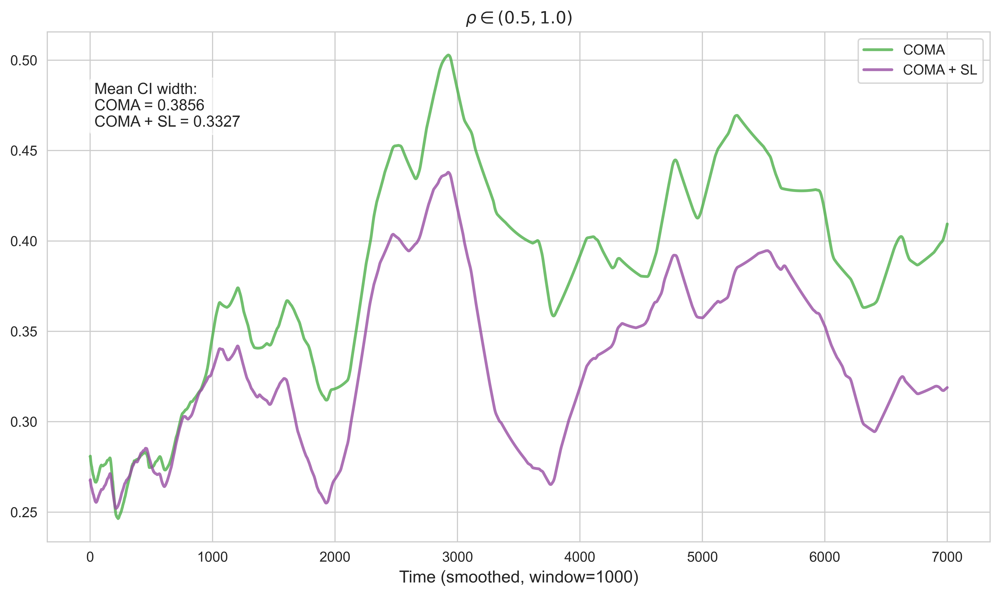

In [92]:

coma_width_rand_smooth    = smooth_series(coma_width_rand, window=1000)
coma_width_rand_sl_smooth = smooth_series(coma_width_rand_sl, window=1000)

# Randomized subplot 
plt.figure(figsize=(10, 6), dpi=500)
plt.plot(coma_width_rand_smooth, label='COMA', linewidth=2, alpha=0.8, color=colors[2])
plt.plot(coma_width_rand_sl_smooth, label='COMA + SL', linewidth=2, alpha=0.8, color=colors[3])
plt.title("$\\rho \\in (0.5,1.0)$", fontsize=12)
plt.xlabel("Time (smoothed, window=1000)", fontsize=12)
plt.legend()
mean_rand = np.nanmean(coma_width_rand_smooth)
mean_rand_sl = np.nanmean(coma_width_rand_sl_smooth)
plt.text(0.05, 0.9,
         f"Mean CI width:\nCOMA = {mean_rand:.4f}\nCOMA + SL = {mean_rand_sl:.4f}",
         transform=plt.gca().transAxes,
         fontsize=11, verticalalignment="top",
             bbox=dict(boxstyle="round", facecolor="white", alpha=0.6))

#plt.suptitle("Sim1 (ARCH, Hedge, Smoothed): CI Widths — COMA(base) vs COMA+Super Learner", fontsize=14)
plt.tight_layout()
plt.savefig("arch1_hedge_smooth_line_comasl.png", dpi=500, bbox_inches="tight")
plt.show()